In [31]:
import geopandas as gpd
import osmnx as ox

<Axes: >

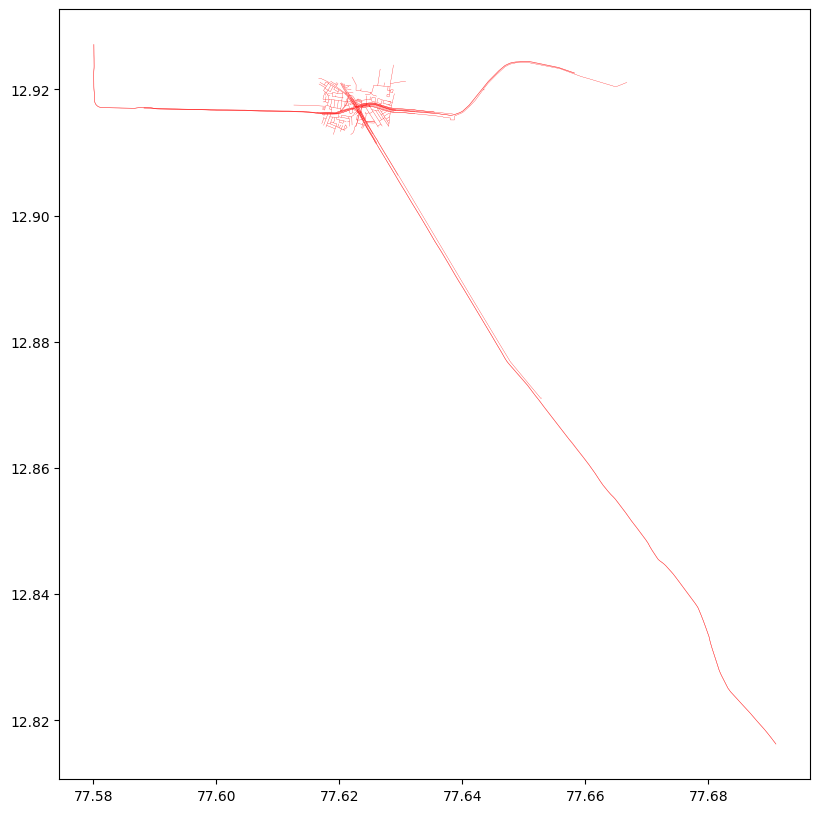

In [32]:
roads = gpd.read_file("map.osm", layer="lines")
roads.plot(figsize=(20,10), color="red", linewidth=0.2)


In [33]:
roads.head()

,osm_id,name,highway,waterway,aerialway,barrier,man_made,railway,z_order,other_tags,geometry
0,27555707,Outer Ring Road,trunk,None,None,None,None,None,8,"""lanes""=>""3"",""maxspeed""=>""40"",""name:kn""=>""ಹೊರ ...","LINESTRING (77.6226 12.9173, 77.62283 12.91737)"
1,27934861,1st Main Road,residential,None,None,None,None,None,3,"""lanes""=>""2"",""name:kn""=>""೧ನೇ ಮುಖ್ಯ ರಸ್ತೆ"",""sur...","LINESTRING (77.62427 12.91718, 77.62468 12.916..."
2,27934864,None,residential,None,None,None,None,None,3,None,"LINESTRING (77.62622 12.91418, 77.62675 12.91451)"
3,27934930,14th B Cross Road,residential,None,None,None,None,None,3,"""name:kn""=>""೧೪ನೇ ಬಿ ಅಡ್ಡರಸ್ತೆ""","LINESTRING (77.62491 12.91616, 77.62547 12.91651)"
4,27934960,1st C Main Road,residential,None,None,None,None,None,3,"""name:kn""=>""೧ನೇ ಸೀ ಮುಖ್ನ ರಸ್ತೆ""","LINESTRING (77.62617 12.91706, 77.62638 12.916..."


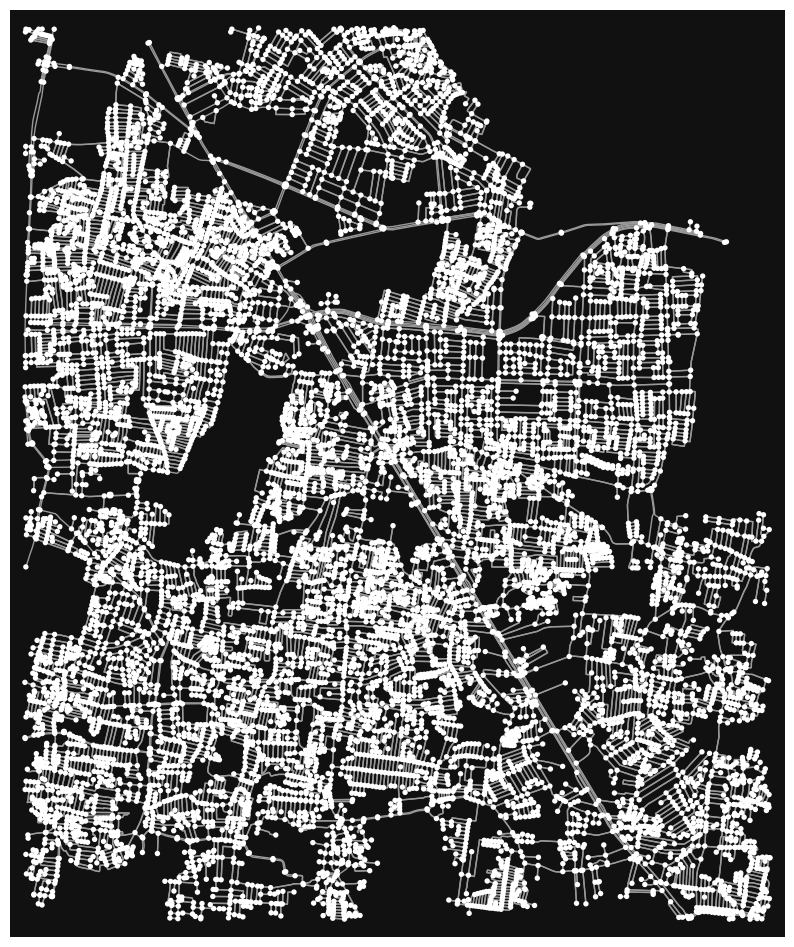

In [34]:
import matplotlib.pyplot as plt
# lbrt
G = ox.graph_from_bbox([77.60,12.87,77.66,12.94],network_type='drive')
fig, ax = ox.plot_graph(G, figsize=(10,30), edge_linewidth=1)

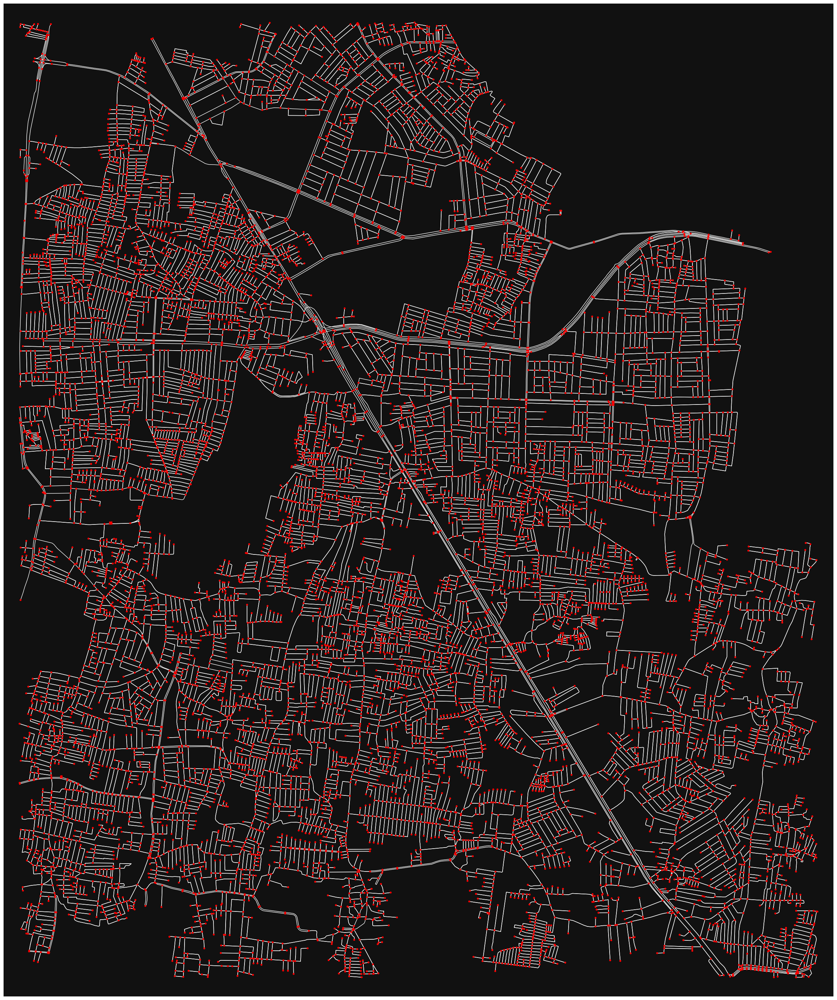

(<Figure size 3000x4000 with 1 Axes>, <Axes: >)

In [35]:
ox.plot_graph(G, figsize=(30, 40), node_color="red", edge_color="white")

In [36]:
nodes,edges=ox.graph_to_gdfs(G)

In [37]:
nodes.head()

,y,x,street_count,highway,geometry
osmid,,,,,
17327139,12.934965,77.624072,3,NaN,POINT (77.62407 12.93497)
17327141,12.938493,77.629168,3,NaN,POINT (77.62917 12.93849)
245613696,12.924564,77.617992,3,NaN,POINT (77.61799 12.92456)
247852770,12.896237,77.608092,3,NaN,POINT (77.60809 12.89624)
247852771,12.897042,77.607138,3,NaN,POINT (77.60714 12.89704)


In [38]:
nodes['highway'].value_counts()

highway
traffic_signals      21
motorway_junction     1
crossing              1
bus_stop              1
Name: count, dtype: int64

In [39]:
nodes['street_count'].value_counts()

street_count
3    7455
1    3006
4    1321
5      12
2       9
Name: count, dtype: int64

In [40]:
edges.columns

Index(['osmid', 'highway', 'lanes', 'name', 'oneway', 'reversed', 'length',
       'geometry', 'maxspeed', 'access', 'ref', 'width', 'est_width', 'bridge',
       'tunnel', 'junction'],
      dtype='object')

In [41]:
edges['bridge'].value_counts()

bridge
yes    89
Name: count, dtype: int64

In [42]:
edges['name'].value_counts()


name
1st Main Road                      316
1st Cross Road                     314
7th Cross Road                     285
5th Cross Road                     264
3rd Cross Road                     240
                                  ... 
[1st Cross Road, 8A Main Road]       1
100 feet Road                        1
[Sarjapura Road, Sarjapur Road]      1
[8A Main Road, 1st Cross Road]       1
39 Cross Road                        1
Name: count, Length: 374, dtype: int64

In [43]:
edges['highway'].value_counts()

highway
residential                     24079
tertiary                         3204
secondary                        1166
living_street                     246
primary                           225
trunk                             149
tertiary_link                      63
trunk_link                         58
unclassified                       38
primary_link                       34
secondary_link                     29
[living_street, residential]       14
[tertiary, residential]             2
[primary_link, primary]             2
[trunk, primary]                    1
busway                              1
Name: count, dtype: int64

viz roads point of interests and other stuff

<Axes: >

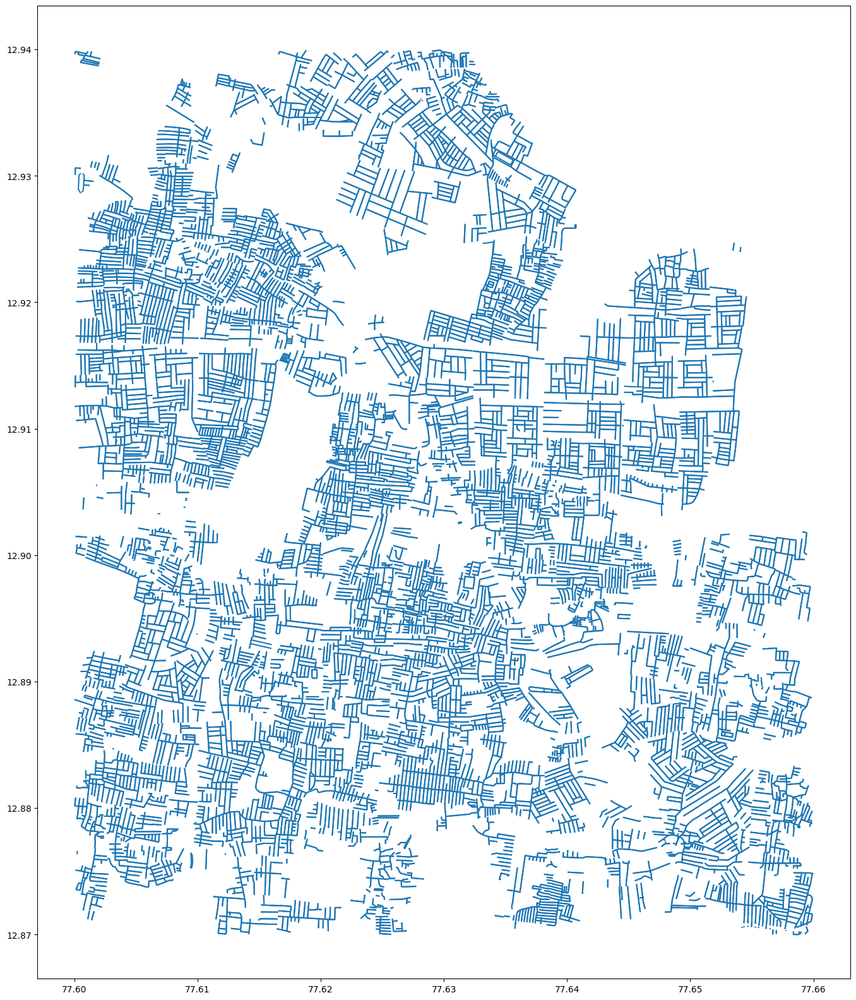

In [44]:
residential=edges[edges['highway']=='residential']
residential.plot(figsize=(20,20))


NameError: name 'tertiary' is not defined

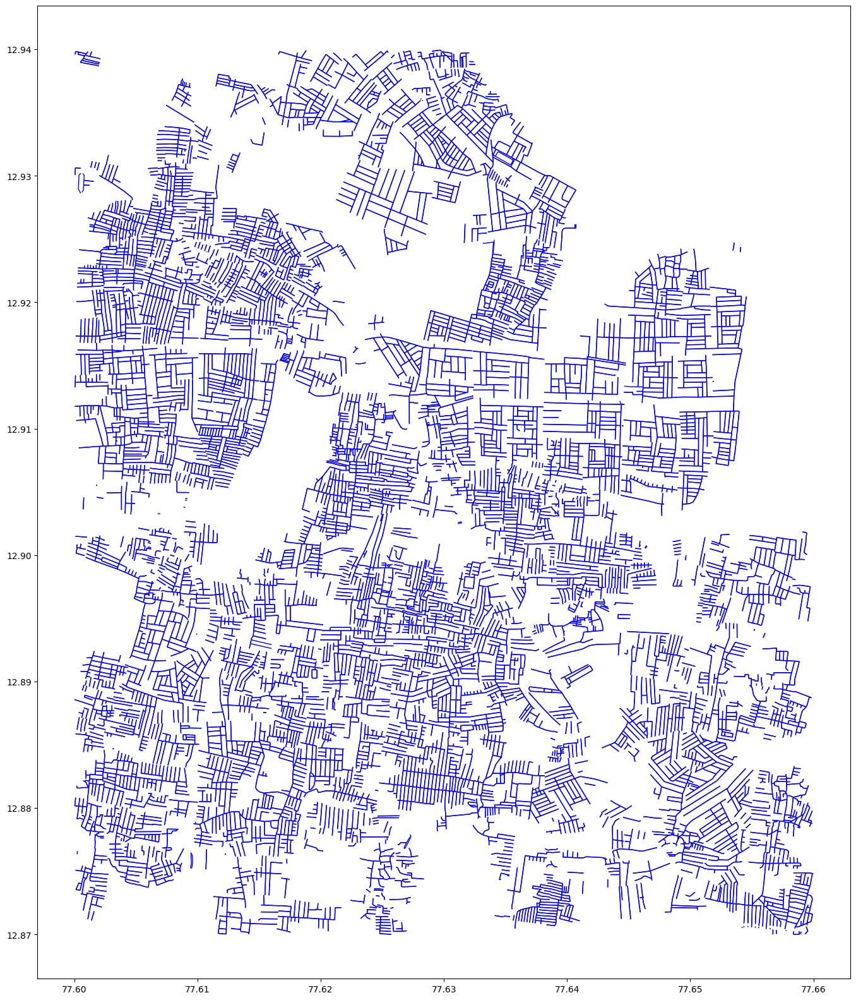

In [45]:
fig, ax = plt.subplots(figsize=(20, 20))
residential.plot(ax=ax, color="blue", linewidth=1, label="Residential")
tertiary.plot(ax=ax, color="red", linewidth=2, label="Tertiary Roads")
plt.legend()
plt.show()


In [ ]:
import folium
from folium.plugins import HeatMap

buildings = gpd.read_file("map.osm", layer="multipolygons")
m = folium.Map(location=[12.934, 77.624], zoom_start=15)

for _, row in buildings.iterrows():
    folium.CircleMarker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],
        radius=3,
        color="blue",
        fill=True,
    ).add_to(m)

m.save("silk_board_buildings.html")


1. Define Study Area
2. Road networks(highway,primary,residential)
3. Buildings and land use
4. Infrasturcutre features
5. road network analysis-identify bottlenecls
6. emergency response planning
7. exposure heatmaps
8. plotting risk maps
9. report

<Axes: >

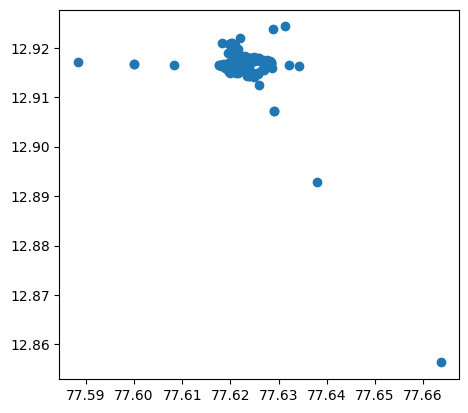

In [ ]:
points=gpd.read_file('map.osm',layer='points')
points.plot()

In [ ]:
points.head()

,osm_id,name,barrier,highway,ref,address,is_in,place,man_made,other_tags,geometry
0,306594280,None,None,traffic_signals,None,None,None,None,None,None,POINT (77.62246 12.91725)
1,494271080,None,None,traffic_signals,None,None,None,None,None,None,POINT (77.62311 12.91731)
2,650141554,None,None,traffic_signals,None,None,None,None,None,None,POINT (77.6322 12.91659)
3,946653489,Vinayaka Temple,None,None,None,None,None,None,None,"""amenity""=>""place_of_worship"",""name:kn""=>""ವಿನಾ...",POINT (77.61973 12.91507)
4,1377891917,None,gate,None,None,None,None,None,None,"""access""=>""military""",POINT (77.6314 12.92431)


In [ ]:
# plot for traffic signals and other stuff in highway

In [ ]:
name=points['name'].dropna().unique()

In [ ]:
points['highway'].value_counts()

highway
street_lamp        46
bus_stop           15
traffic_signals     6
crossing            3
Name: count, dtype: int64

In [ ]:
traffic_signals=points[points['highway']=='traffic_signals']

<Axes: >

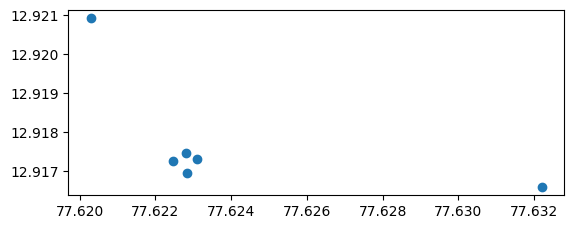

In [ ]:
traffic_signals.plot()

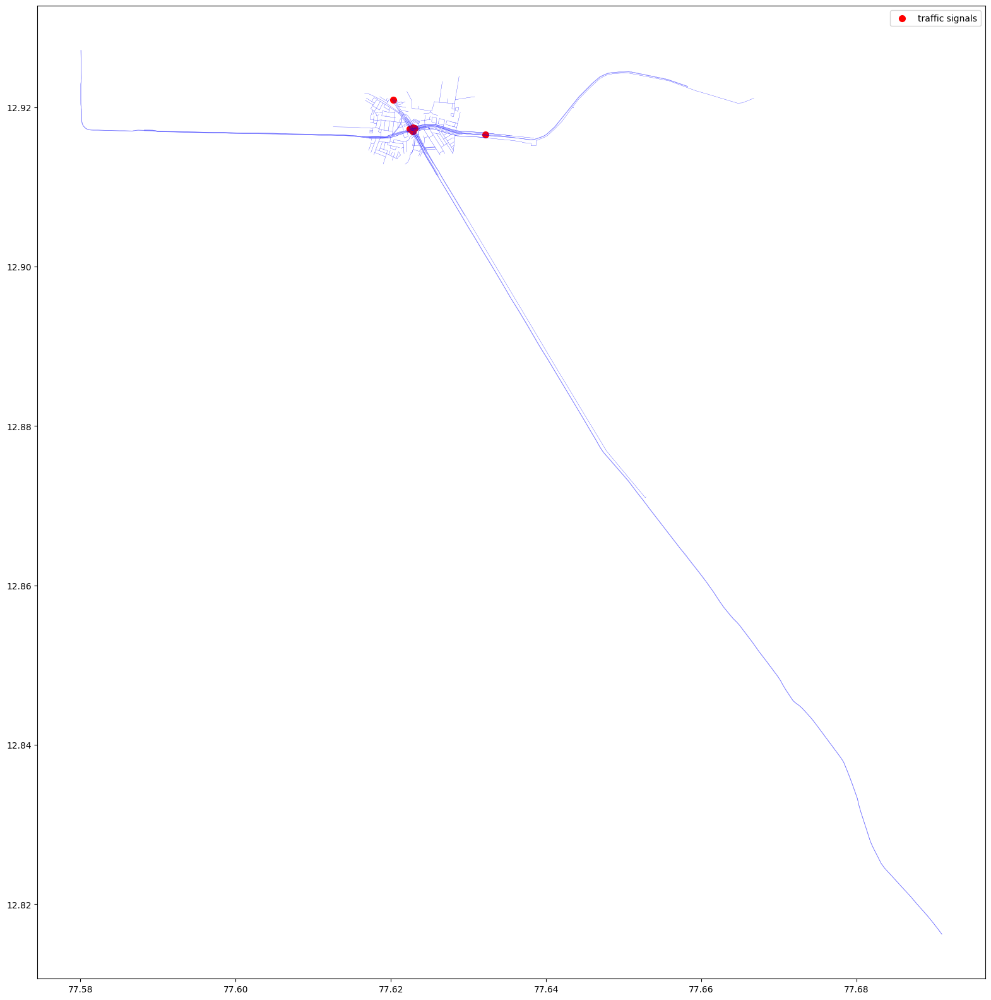

In [ ]:
fig,ax=plt.subplots(figsize=(20, 20))
roads.plot(ax=ax, color="blue",linewidth=0.2)
traffic_signals.plot(ax=ax, color="red", linewidth=2, label="traffic signals")
plt.legend()
plt.show()

In [ ]:
lamps=points[points['highway']=='street_lamp']

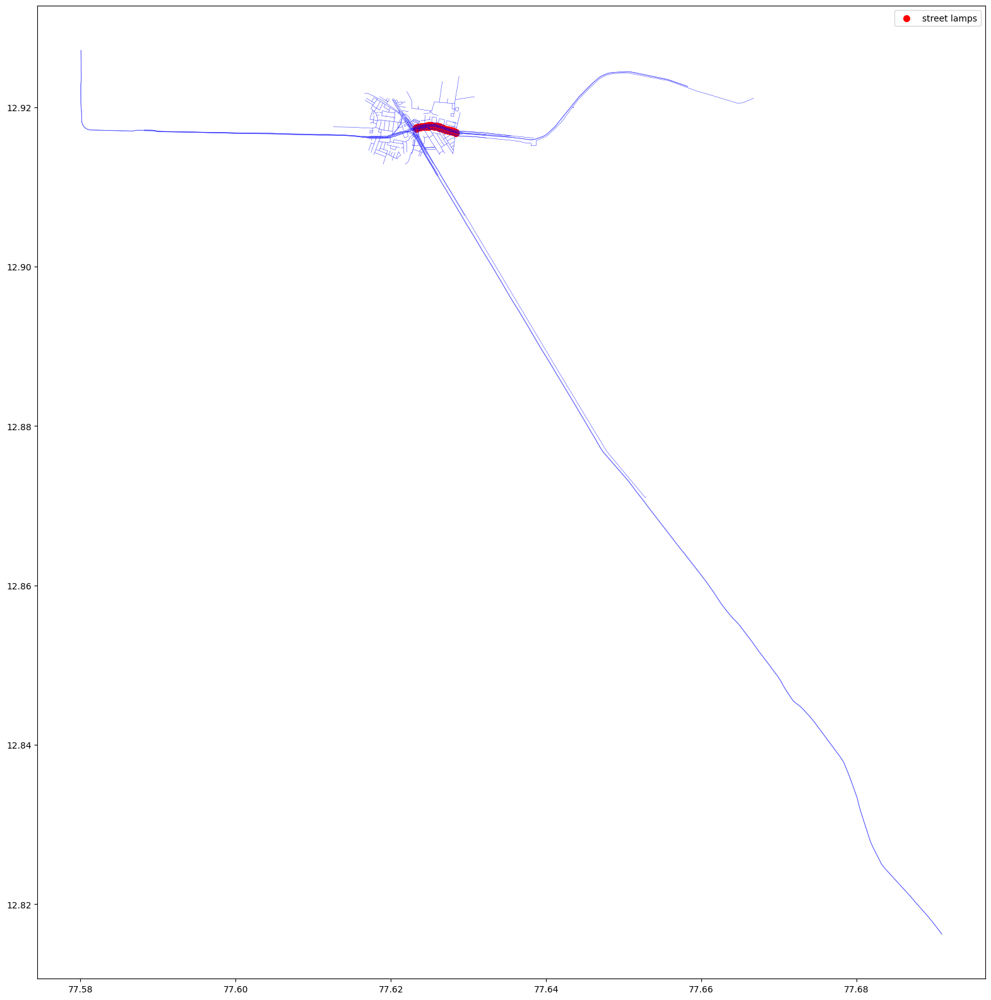

In [ ]:
fig,ax=plt.subplots(figsize=(20, 20))
roads.plot(ax=ax,color='blue',linewidth=0.3)
lamps.plot(ax=ax, color="red", linewidth=2, label="street lamps")
plt.legend()
plt.show()

In [ ]:
bus_stop=points[points['highway']=='bus_stop']

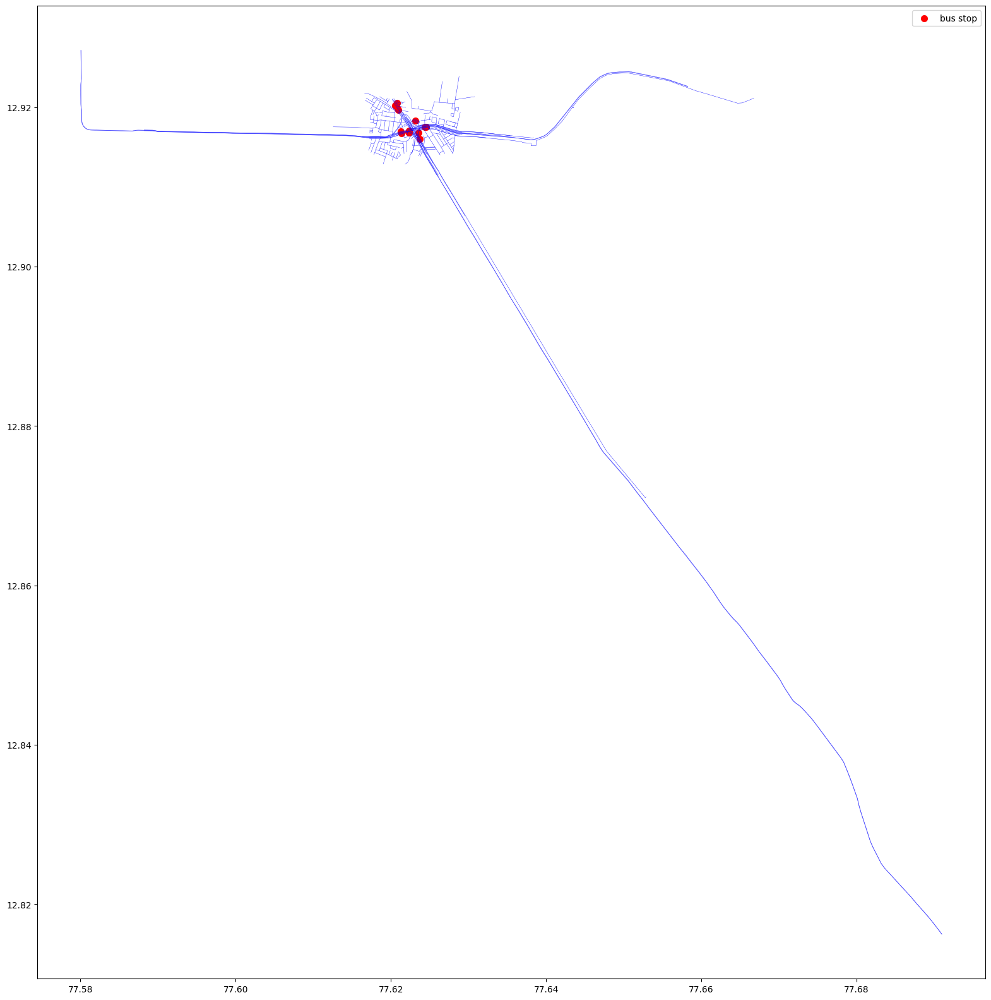

In [ ]:
fig,ax=plt.subplots(figsize=(20, 20))
roads.plot(ax=ax,color='blue',linewidth=0.3)
bus_stop.plot(ax=ax, color="red", linewidth=2, label="bus stop")
plt.legend()
plt.show()

In [ ]:
crossing=points[points['highway']=='crossing']

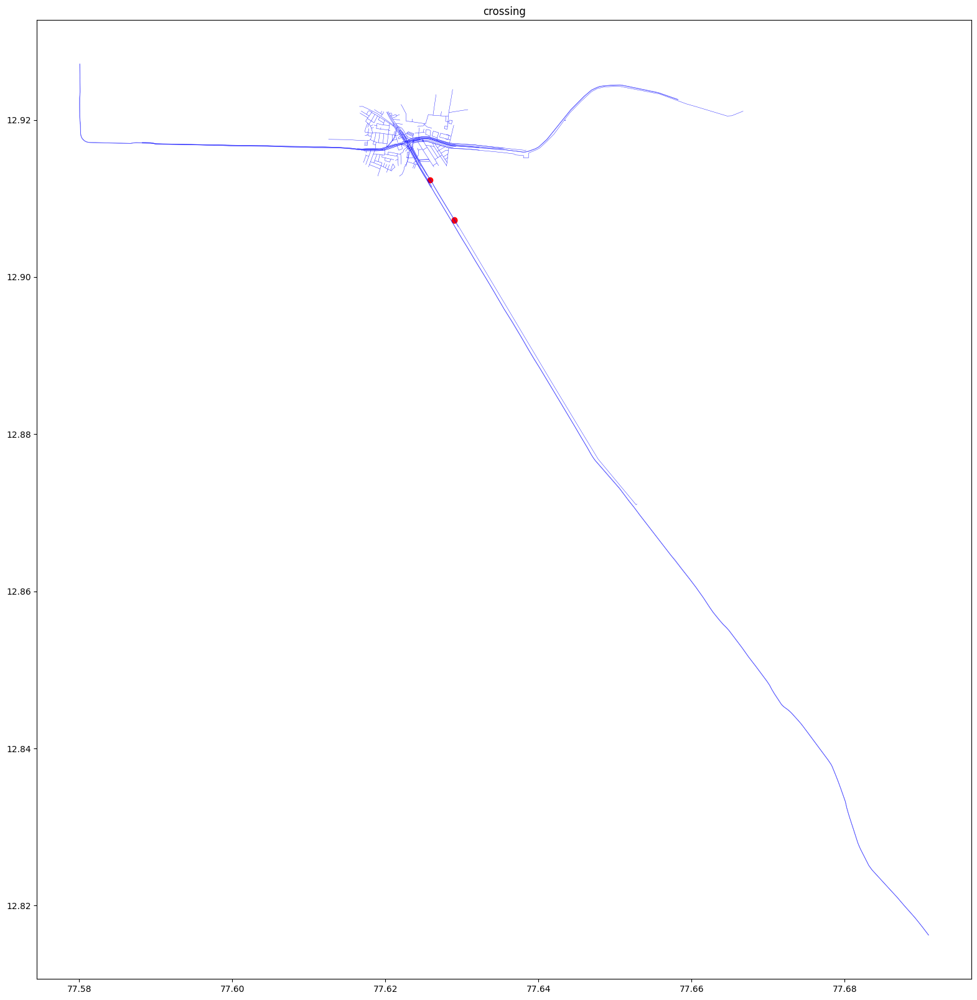

In [ ]:
fig,ax=plt.subplots(figsize=(20,20))
roads.plot(ax=ax,linewidth=0.3,color='blue')
crossing.plot(ax=ax,color='red',label='crossing')
plt.title('crossing')
plt.show()

In [ ]:
name_location = points[points['name'].isin(name)]

In [ ]:
name_location.head()

,osm_id,name,barrier,highway,ref,address,is_in,place,man_made,other_tags,geometry
3,946653489,Vinayaka Temple,None,None,None,None,None,None,None,"""amenity""=>""place_of_worship"",""name:kn""=>""ವಿನಾ...",POINT (77.61973 12.91507)
5,1467918892,NIIT Technologies,None,None,None,None,None,None,None,"""addr:street""=>""Rupena Agrahara, Hosur Road, B...",POINT (77.62426 12.91519)
6,1471690115,Tara Fiat Service,None,None,None,None,None,None,None,"""addr:street""=>""Hosur road"",""shop""=>""car_repair""",POINT (77.62392 12.91452)
9,1474317196,Karanth Speciality Hospital,None,None,None,None,None,None,None,"""addr:district""=>""Bengaluru Rural"",""addr:full""...",POINT (77.61936 12.91601)
10,1474433302,Preethi Bakery & Sweets,None,None,None,None,None,None,None,"""shop""=>""bakery""",POINT (77.61849 12.91678)


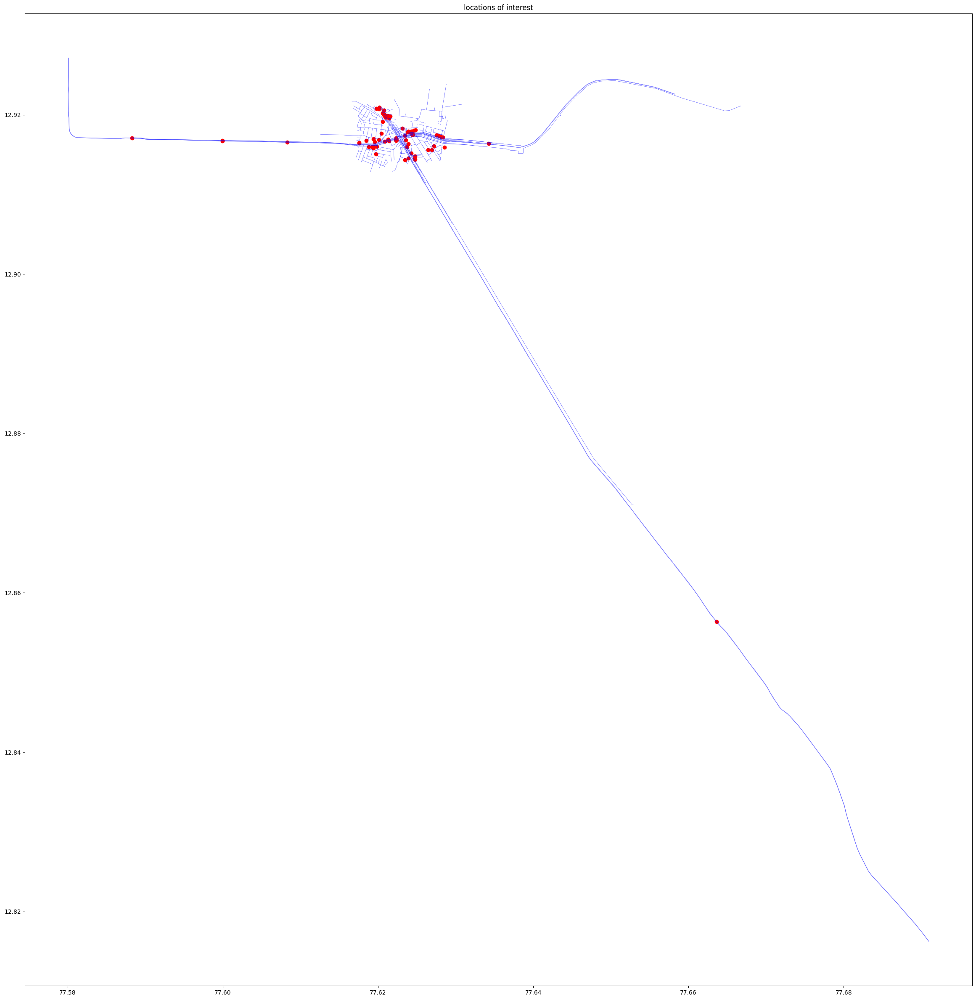

In [ ]:
fig,ax=plt.subplots(figsize=(30,30))
roads.plot(ax=ax,linewidth=0.3,color='blue',label='POI')
name_location.plot(ax=ax,color='red')
plt.title('locations of interest')
plt.show()

In [ ]:
import folium
from folium.plugins import MarkerCluster
import geopandas as gpd

m = folium.Map(location=[name_location.geometry.y.mean(), name_location.geometry.x.mean()], zoom_start=15)

for _, road in roads.iterrows():
    if road.geometry.geom_type == "LineString": 
        folium.PolyLine(
            locations=[(point[1], point[0]) for point in road.geometry.coords],  
            color="blue",
            weight=1,
            opacity=0.5
        ).add_to(m)

marker_cluster = MarkerCluster().add_to(m) 
for _, row in name_location.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['name'], 
        tooltip=row['name'], 
        icon=folium.Icon(color="red", icon="info-sign")
    ).add_to(marker_cluster)

m.save("interactive_map.html")

<Axes: >

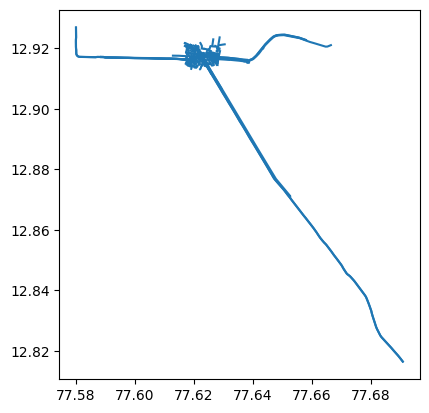

In [ ]:
roads.plot()

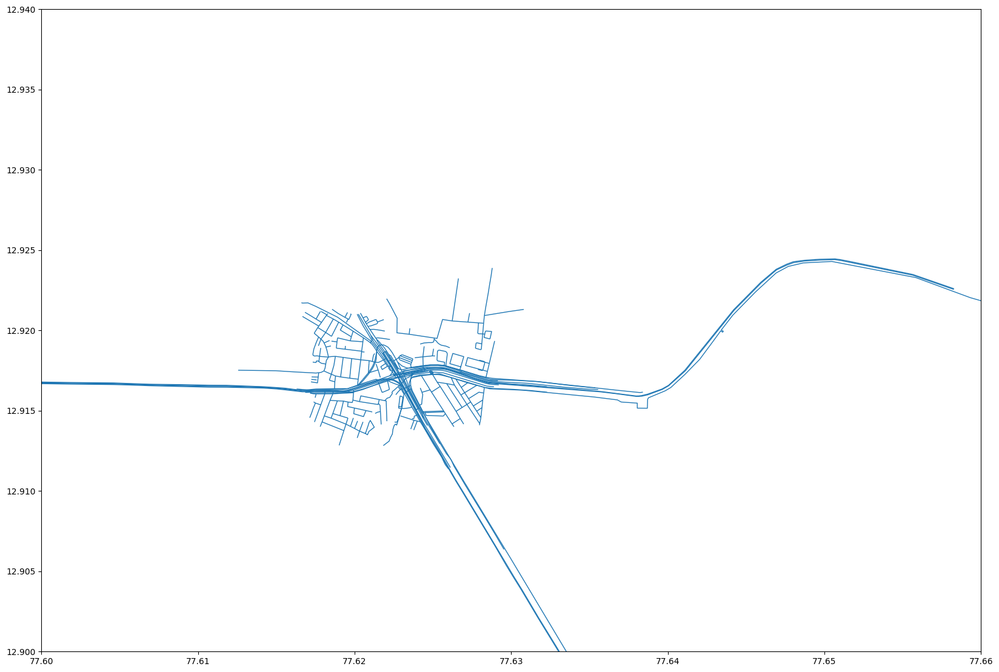

In [ ]:
roads=gpd.read_file('map.osm', layer='lines')
fig, ax = plt.subplots(figsize=(20,20))
roads.plot(ax=ax, linewidth=1)
ax.set_xlim([77.60, 77.66]) 
ax.set_ylim([12.90, 12.94]) 
plt.show()


In [ ]:
roads.head()

,osm_id,name,highway,waterway,aerialway,barrier,man_made,railway,z_order,other_tags,geometry
0,27555707,Outer Ring Road,trunk,None,None,None,None,None,8,"""lanes""=>""3"",""maxspeed""=>""40"",""name:kn""=>""ಹೊರ ...","LINESTRING (77.6226 12.9173, 77.62283 12.91737)"
1,27934861,1st Main Road,residential,None,None,None,None,None,3,"""lanes""=>""2"",""name:kn""=>""೧ನೇ ಮುಖ್ಯ ರಸ್ತೆ"",""sur...","LINESTRING (77.62427 12.91718, 77.62468 12.916..."
2,27934864,None,residential,None,None,None,None,None,3,None,"LINESTRING (77.62622 12.91418, 77.62675 12.91451)"
3,27934930,14th B Cross Road,residential,None,None,None,None,None,3,"""name:kn""=>""೧೪ನೇ ಬಿ ಅಡ್ಡರಸ್ತೆ""","LINESTRING (77.62491 12.91616, 77.62547 12.91651)"
4,27934960,1st C Main Road,residential,None,None,None,None,None,3,"""name:kn""=>""೧ನೇ ಸೀ ಮುಖ್ನ ರಸ್ತೆ""","LINESTRING (77.62617 12.91706, 77.62638 12.916..."


In [ ]:
roads['highway'].value_counts()

highway
residential      88
service          62
trunk            35
trunk_link       21
tertiary         17
primary          12
construction      8
tertiary_link     5
footway           5
steps             2
path              1
track             1
living_street     1
Name: count, dtype: int64

In [ ]:
residential=roads[roads['highway']=='residential']
service=roads[roads['highway']=='service']
trunk=roads[roads['highway']=='trunk']
trunk_link=roads[roads['highway']=='trunk_link']
tertiary=roads[roads['highway']=='tertiary']
primary=roads[roads['highway']=='primary']
construction=roads[roads['highway']=='construction']
tertiary_link=roads[roads['highway']=='tertiary_link']
footway=roads[roads['highway']=='footway']
steps=roads[roads['highway']=='steps']
track=roads[roads['highway']=='track']
path=roads[roads['highway']=='path']
living_street=roads[roads['highway']=='living_street']

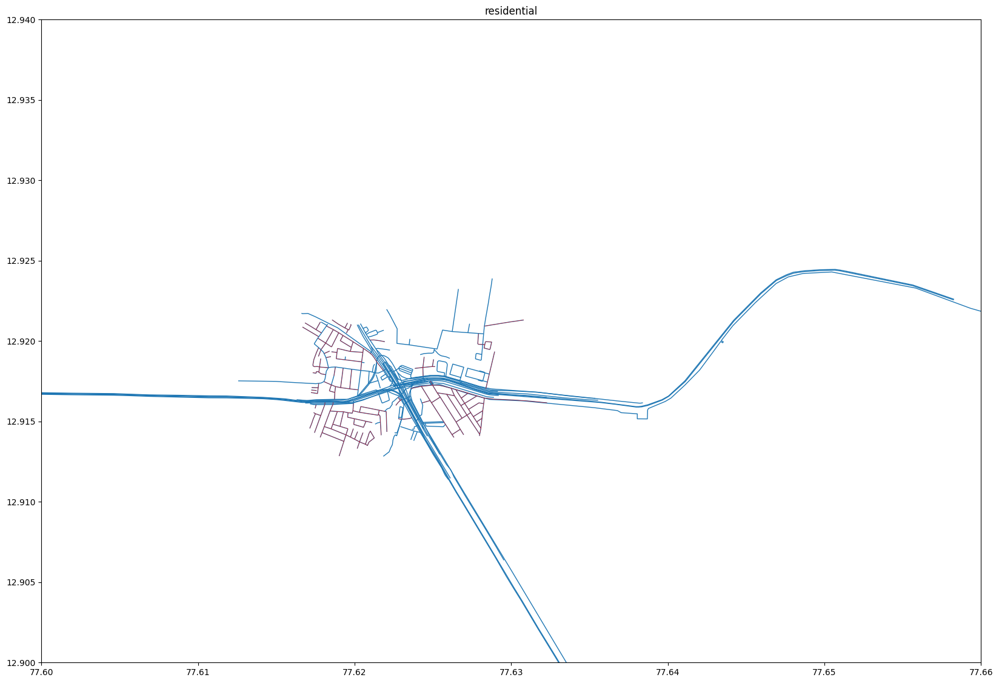

In [ ]:
fig,ax=plt.subplots(figsize=(20,20))
roads.plot(ax=ax,linewidth=1)
residential.plot(ax=ax,color='red',linewidth=0.4,label='residential')
ax.set_xlim([77.60, 77.66]) 
ax.set_ylim([12.90, 12.94]) 
plt.title('residential')
plt.show()

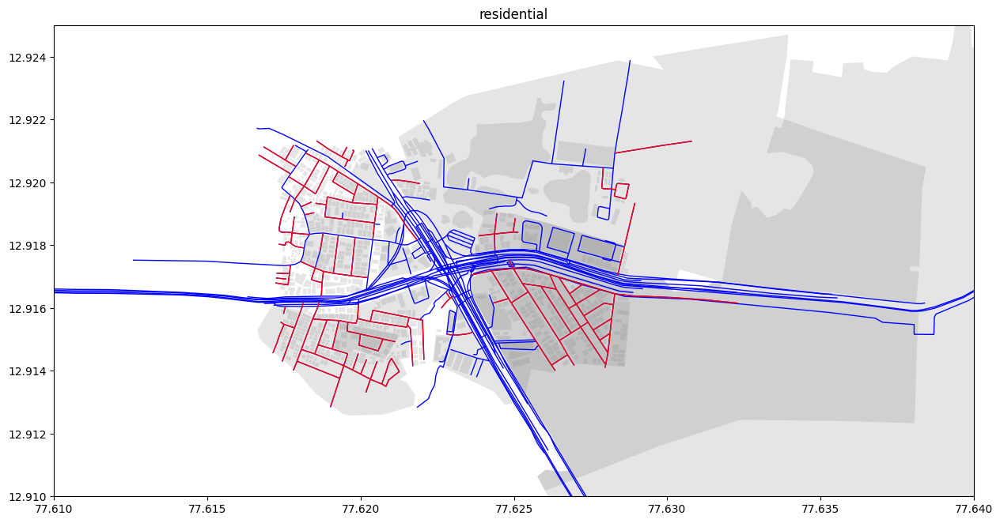

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=1,color='blue')
residential.plot(ax=ax,color='red',linewidth=1,label='residential')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925])  
plt.title('residential')
plt.show()

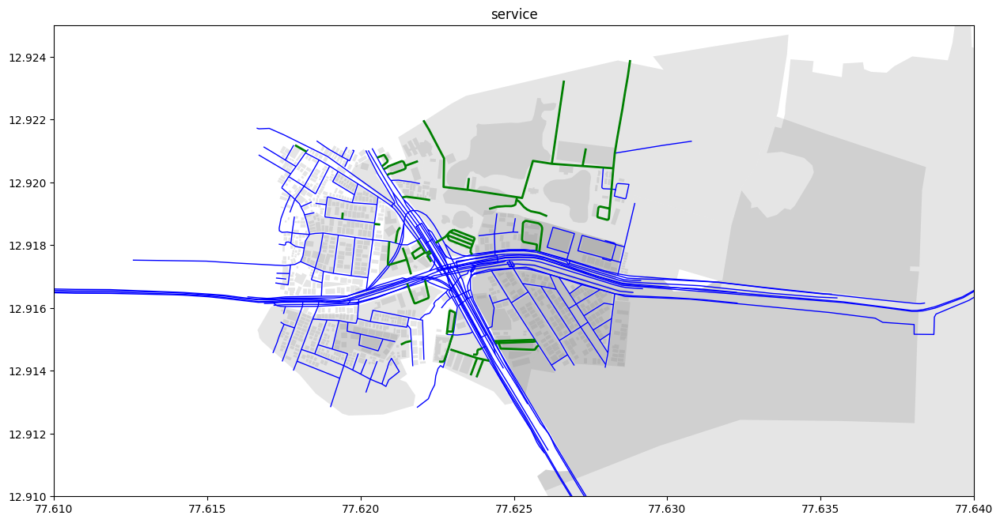

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=1,color='blue')
service.plot(ax=ax,color='green',linewidth=2,label='service')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.title('service')
plt.show()

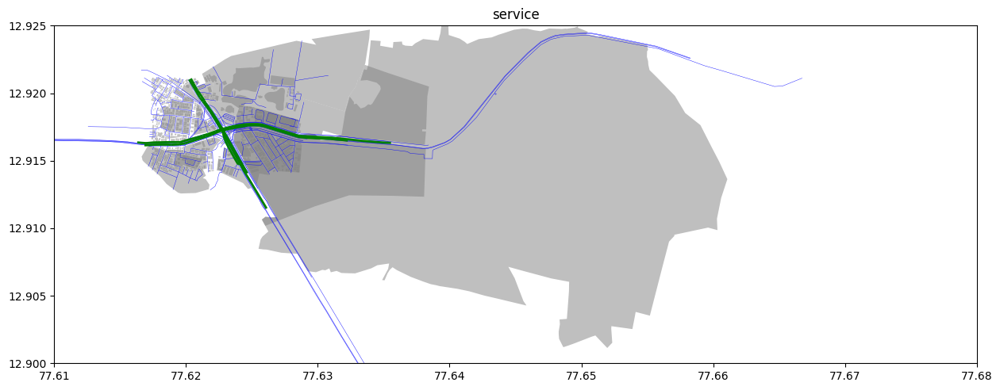

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue')
trunk.plot(ax=ax,color='green',linewidth=2,label='trunk')
area.plot(ax=ax,color='grey',alpha=0.5)
ax.set_xlim([77.61, 77.68]) 
ax.set_ylim([12.90, 12.925]) 
plt.title('service')
plt.show()

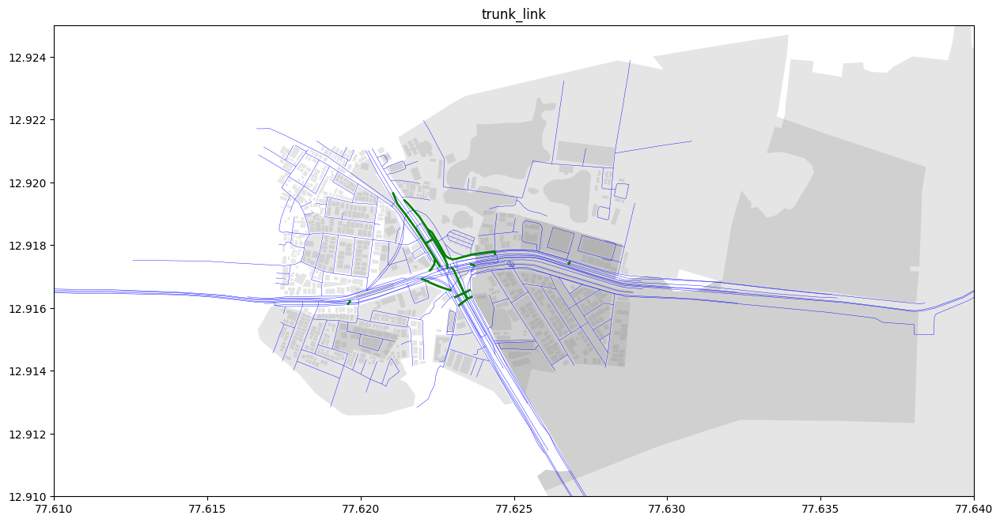

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue')
trunk_link.plot(ax=ax,color='green',linewidth=2,label='trunk link')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.title('trunk_link')
plt.show()

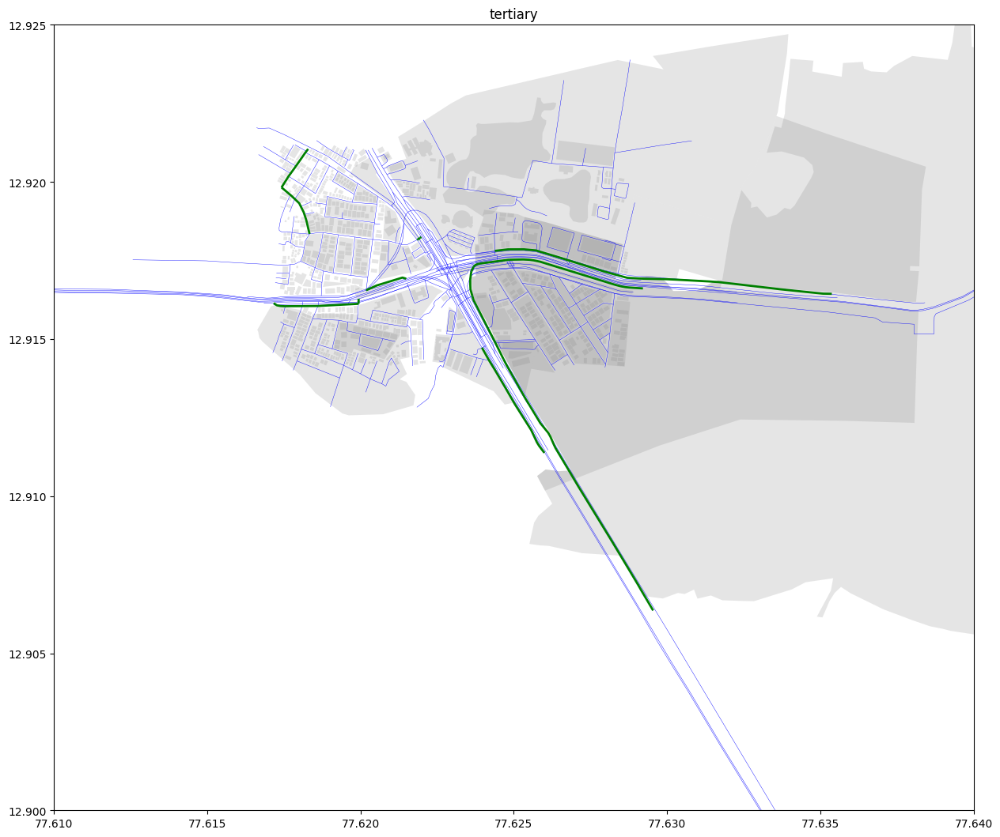

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue')
tertiary.plot(ax=ax,color='green',linewidth=2,label='tertiary')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.90, 12.925]) 
plt.title('tertiary')
plt.show()

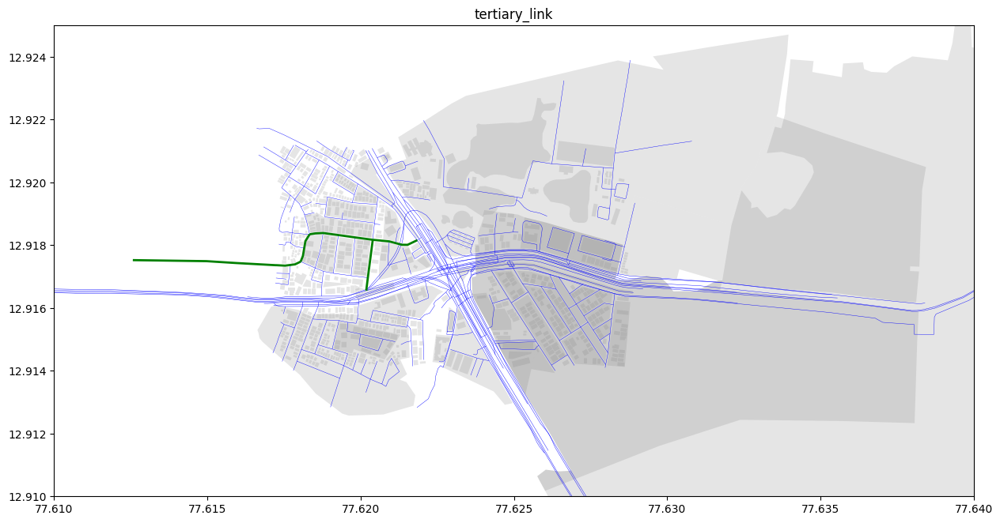

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue')
tertiary_link.plot(ax=ax,color='green',linewidth=2,label='tertiary_link')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.title('tertiary_link')
plt.show()

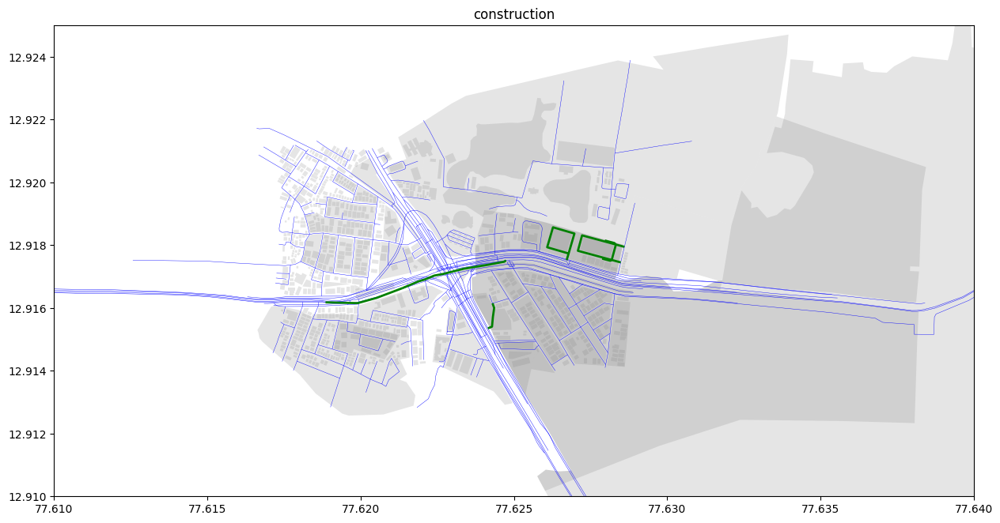

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue')
construction.plot(ax=ax,color='green',linewidth=2,label='construction')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.title('construction')
plt.show()

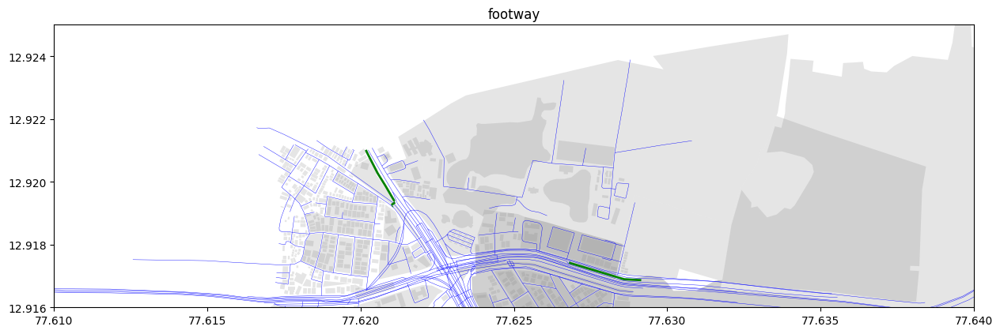

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue')
footway.plot(ax=ax,color='green',linewidth=2,label='footway')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.916, 12.925]) 
plt.title('footway')
plt.show()

steps track path living_street

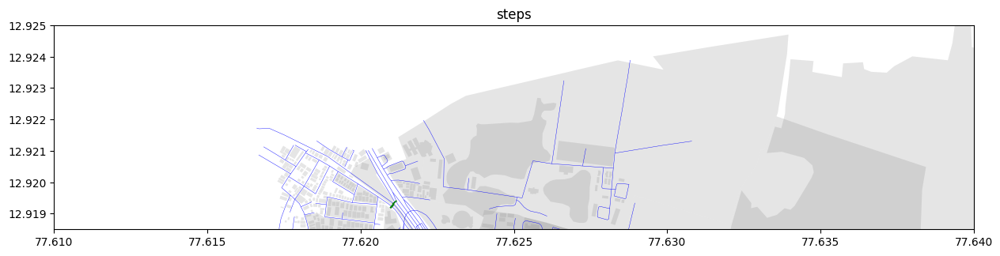

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue')
steps.plot(ax=ax,color='green',linewidth=5,label='steps')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.9185, 12.925]) 
plt.title('steps')
plt.show()

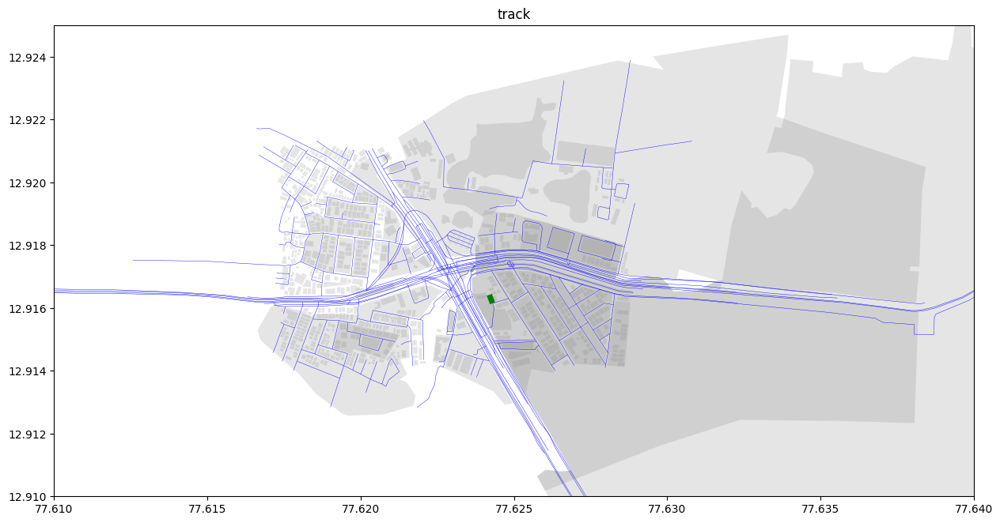

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue')
track.plot(ax=ax,color='green',linewidth=5,label='track')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.title('track')
plt.show()

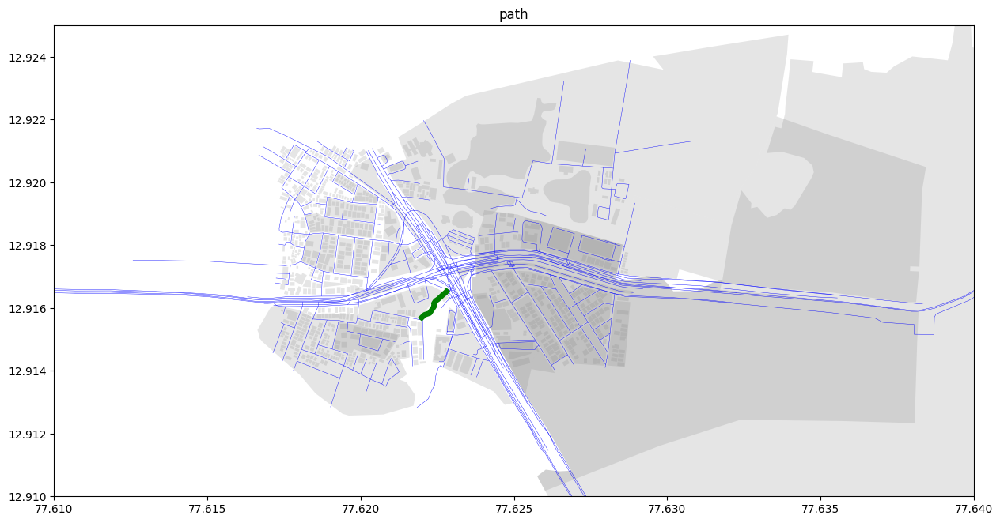

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue',label='road')
path.plot(ax=ax,color='green',linewidth=5,label='path')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.title('path')
plt.show()

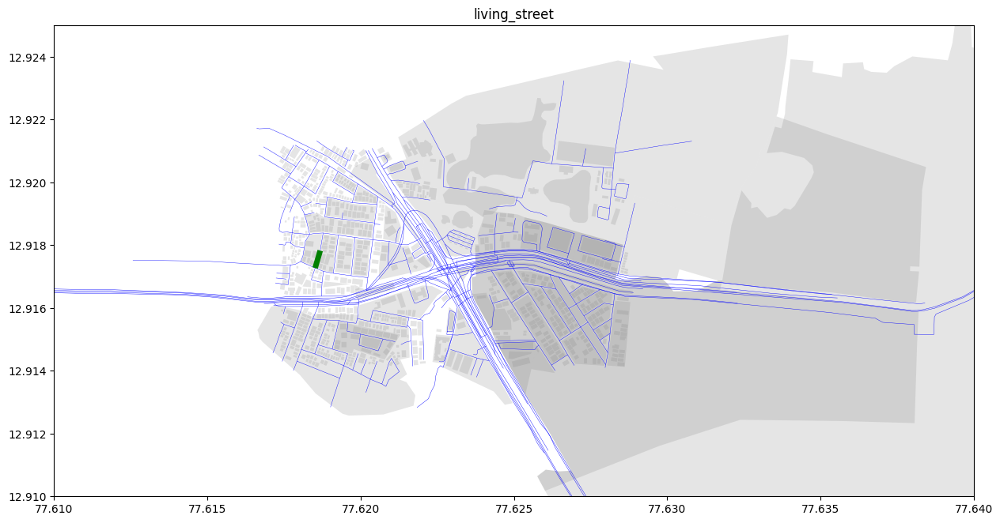

In [ ]:
area=gpd.read_file('map.osm',layer='multipolygons')
fig,ax=plt.subplots(figsize=(15,15))
roads.plot(ax=ax,linewidth=0.3,color='blue',label='road')
living_street.plot(ax=ax,color='green',linewidth=5,label='living_street')
area.plot(ax=ax,color='grey',alpha=0.2)
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.title('living_street')
plt.show()

In [87]:
mlp=gpd.read_file('map.osm',layer='multipolygons')

In [88]:
mlp.head()

,osm_id,osm_way_id,name,type,aeroway,amenity,admin_level,barrier,boundary,building,...,man_made,military,natural,office,place,shop,sport,tourism,other_tags,geometry
0,5259863,None,None,multipolygon,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((77.62077 12.91848, 77.62104 12..."
1,17168004,None,Sector 6,boundary,None,None,None,None,None,None,...,None,None,None,None,neighbourhood,None,None,None,"""name:kn""=>""ಸೆಕ್ಟರ್ ೬""","MULTIPOLYGON (((77.62683 12.91082, 77.62648 12..."
2,17168010,None,HSR Layout,boundary,None,None,None,None,None,None,...,None,None,None,None,suburb,None,None,None,"""alt_name""=>""Hosur-Sarjapur Road Layout"",""name...","MULTIPOLYGON (((77.62374 12.91776, 77.62373 12..."
3,None,41184090,Karnataka State Reserve Police Quarters,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,"""access""=>""restricted"",""short_name""=>""KSRP Qua...","MULTIPOLYGON (((77.62606 12.91871, 77.62715 12..."
4,None,128220238,Central Silk Board,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,"""alt_name""=>""Central Silk Technological Resear...","MULTIPOLYGON (((77.62165 12.91653, 77.62178 12..."


In [89]:
mlp.columns

Index(['osm_id', 'osm_way_id', 'name', 'type', 'aeroway', 'amenity',
       'admin_level', 'barrier', 'boundary', 'building', 'craft', 'geological',
       'historic', 'land_area', 'landuse', 'leisure', 'man_made', 'military',
       'natural', 'office', 'place', 'shop', 'sport', 'tourism', 'other_tags',
       'geometry'],
      dtype='object')

In [90]:
mlp['building'].value_counts()

building
yes              785
office             4
apartments         4
commercial         4
construction       3
retail             2
house              2
roof               1
hotel              1
train_station      1
Name: count, dtype: int64

In [91]:
building_yes=mlp[mlp['building']=='yes']

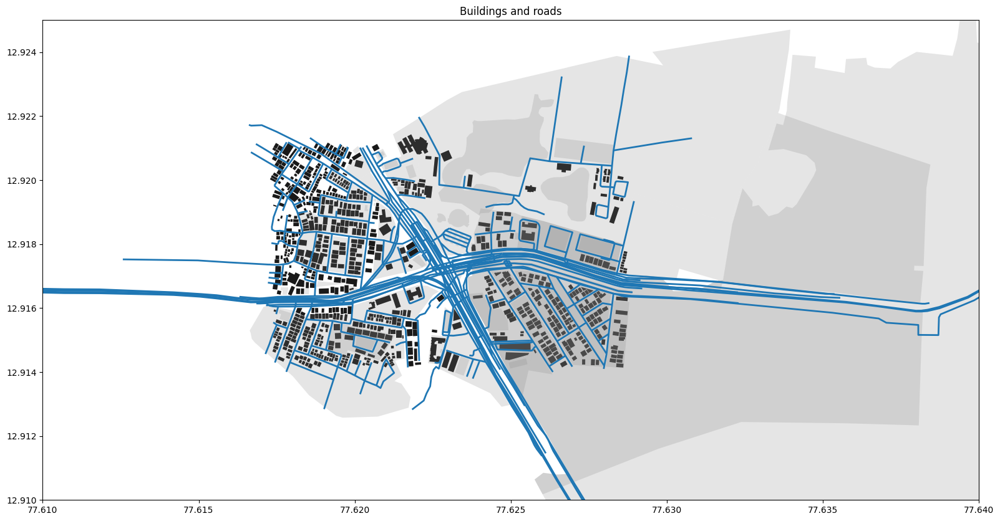

In [95]:
fig,ax=plt.subplots(figsize=(20,10))
building_yes.plot(ax=ax,color='black')
roads.plot(ax=ax,label='road',linewidth=2)
area.plot(ax=ax,color='grey',alpha=0.2)
plt.title('Buildings and roads')
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.show()

In [93]:
office=mlp[mlp['building']=='office']

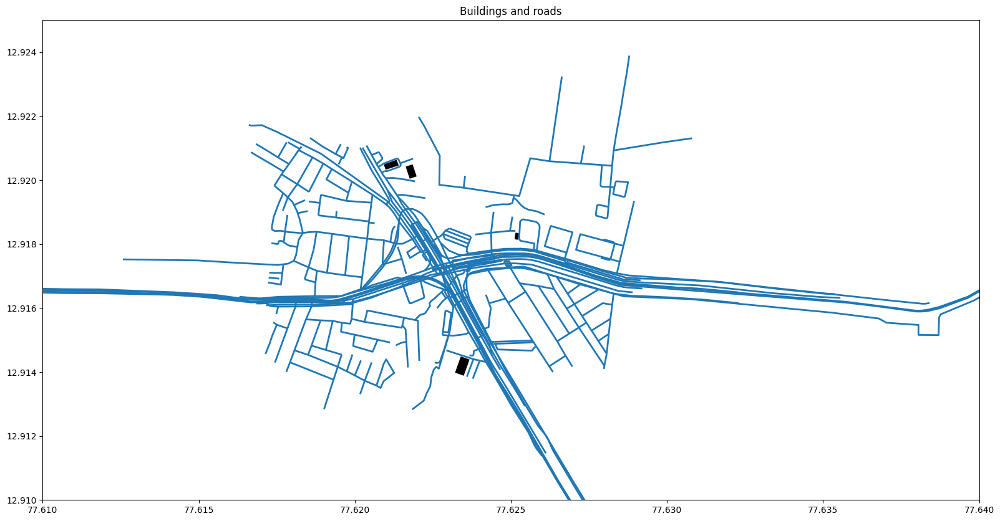

In [94]:
fig,ax=plt.subplots(figsize=(20,10))
office.plot(ax=ax,color='black')
roads.plot(ax=ax,label='road',linewidth=2)
plt.title('Buildings and roads')
ax.set_xlim([77.61, 77.64]) 
ax.set_ylim([12.91, 12.925]) 
plt.show()